<a href="https://colab.research.google.com/github/AikoPath/imdb_guest_actor_rating/blob/master/IMDB_episode_rating_comparison_by_cast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Star Trek: The next Generation: 0092455 # Doctor Who: 0436992 # Breaking Bad: 0903747 # Game of Thrones: 0944947 # Community: 1439629 # Seinfeld: 0098904 # Modern Family: 1442437 # Brooklyn Nine-Nine: 2467372 # Sherlock: 1475582
SERIES_TO_ANALYSE = "0436992"

ACTORS_WITH_MORE_APPEARANCES_THAN = 5 # -1 to not include these actors at all
ACTORS_WITH_LESS_ROLES_THAN = 5 # -1 to not limit by this

PEOPLE_OF_INTEREST = []
#[{'id':'0000155','name':'Whoopi Goldberg', 'character':'Guinan'},
#{'id':'0000344','name':'Denise Crosby', 'character':'Tasha Yar / Sela'} ,
#{'id':'0000405','name':'Michelle Forbes', 'character': 'Ro Laren / Dara'},
#{'id':'0000533','name':'Gates McFadden', 'character':'Dr. Beverly Crusher'},
#{'id':'0000538','name':'Colm Meaney', 'character':'Chief Miles O\'Brien'},
#{'id':'0000696','name':'Wil Wheaton', 'character':'Wesley Crusher'},
#{'id':'0209496','name':'John de Lancie', 'character':'Q'},
#{'id':'0611707','name':'Diana Muldaur', 'character':'Doctor Pulaski'},
#{'id':'0776239','name':'Dwight Schultz', 'character':'Barclay'}]

PAIRS_OF_INTEREST = []
#[(PEOPLE_OF_INTEREST[0], PEOPLE_OF_INTEREST[6]),
# (PEOPLE_OF_INTEREST[3], PEOPLE_OF_INTEREST[7]),
# (PEOPLE_OF_INTEREST[3], PEOPLE_OF_INTEREST[5])]

# Set up

In [2]:
!pip install IMDbPY

%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from imdb import IMDb
import collections
import re
from google.colab import files

## Load Series reference and episodes list


In [4]:
imdb = IMDb()
series = imdb.get_movie(SERIES_TO_ANALYSE)
print("Loadind Data for "+ str(series))
imdb.update(series, 'episodes')

Loadind Data for Doctor Who


## Load episode data 

Calling `imdb.update(episode)` adds the detailed episode data we need later like `rating` and `cast` to the episode/movie
instance.

In [5]:
def load_episode_data(imdb, series):
  for season_id in sorted(series['episodes']):
    print('\nloading episode data for season ' + str(season_id) + ':', end='')
    for espisode_id in series['episodes'][season_id]:
      imdb.update(series['episodes'][season_id][espisode_id])
      print('.' , end='')

In [6]:
load_episode_data(imdb, series)


loading episode data for season -1:.
loading episode data for season 1:.............
loading episode data for season 2:..............
loading episode data for season 3:..............
loading episode data for season 4:..............
loading episode data for season 5:.............
loading episode data for season 6:..............
loading episode data for season 7:...............
loading episode data for season 8:.............
loading episode data for season 9:..............
loading episode data for season 10:.............
loading episode data for season 11:............
loading episode data for season 12:...........
loading episode data for season 13:.........
loading episode data for season 14:...

## Prepare Character Data

In [7]:
def get_characters(cast_member):
  characters = []

  if cast_member._Container__role:
    try:
      characters.append(cast_member._Container__role.data['name'])
    except:
      for character in cast_member._Container__role:
        characters.append(character.data['name'])
    
  return characters

def get_people_of_interest(series, min_count, max_roles):
  if min_count == -1:
    return []
  total_episode_count = 0
  appearances = {}

  for season_id in series['episodes']:
    for episode_id in series['episodes'][season_id]:
      if 'cast' in series['episodes'][season_id][episode_id]:
        total_episode_count += 1
        for cast_member in series['episodes'][season_id][episode_id]['cast']:
          id = cast_member.personID
          name = cast_member['name']
          characters = get_characters(cast_member)

          if id not in appearances:
            appearances[id] = {'id':id, 'name':name, 'characters': set(characters), 'count': 1}
          else:
            appearances[id]['characters'].update(characters)
            appearances[id]['count'] +=1
                    
  people_of_interest = [{'id':appearance['id'], 'name':appearance['name'], 'character': str(appearance['characters']), 'appearances': appearance['count']} for appearance in appearances.values() if appearance['count'] > min_count and appearance['count'] < total_episode_count and len(appearance['characters']) < max_roles]
  
  print("People considered of interest: "+ str([person['name'] for person in people_of_interest]))
  return people_of_interest

In [8]:
def actor_is_in_episode(episode, actor):
  if 'cast' in episode:
    for actor_in_cast in episode['cast']:
      if actor_in_cast.personID == actor['id']:
        return True
  return False

## Prepare data to be plotted

In [9]:
def get_ratings_and_titles(series):
  ratings = []
  titles = []
  
  for season_id in sorted(series['episodes']):
    for episode_id in series['episodes'][season_id]:
      episode = series['episodes'][season_id][episode_id]
      titles.append(episode['title'] + ' (S{:02d}E{:02d})'.format(season_id, episode_id))
      
      # TODO find a better solution
      try:
        ratings.append(episode['rating'])
      except:
        ratings.append(0)
            
  return ratings, titles

In [10]:
def actor_appears_in_episodes(series, actor):
  actor_appears_in_episodes = []
 
  for season_id in sorted(series['episodes']):
    for episode_id in series['episodes'][season_id]:
      episode = series['episodes'][season_id][episode_id]
      actor_appears_in_episodes.append(actor_is_in_episode(episode, actor))

  return actor_appears_in_episodes

In [11]:
def get_episode_appearances_for_two_actors(series, actor1, actor2):
  actor1_in_episodes = actor_appears_in_episodes(series, actor1)
  actor2_in_episodes = actor_appears_in_episodes(series, actor2)
  both_actors_appear_in_episode = np.logical_and(actor1_in_episodes, actor2_in_episodes)
  non_of_the_actors_appear_in_episode =  np.logical_not(np.logical_or(actor1_in_episodes, actor2_in_episodes))
  # only_actor1_in_episodes = np.logical_xor(both_actors_appear_in_episode, actor1_in_episodes)
  # only_actor2_in_episodes = np.logical_xor(both_actors_appear_in_episode, actor2_in_episodes)
  
  return (actor1_in_episodes, actor2_in_episodes, both_actors_appear_in_episode, non_of_the_actors_appear_in_episode)

In [12]:
def get_color_for_two_actors(actor1_appearance, actor2_appearance):  
  if (actor1_appearance and actor2_appearance):
    return 'green'
  if actor1_appearance:
    return 'blue'
  if actor2_appearance:
    return 'red'
  return 'grey'

## Calculate the average rating for actor appearances 

In [13]:
def get_average(sum_ratings, count):
  return sum_ratings / count if count else 0

In [14]:
def get_average_for_appearances(ratings, appearances):
  return get_average(sum((rating * appearance) for rating, appearance in zip (ratings, appearances)), appearances.count(True))

In [15]:
def get_average_ratings_for_two_actors(series, ratings, actor1, actor2):
    actor1_in_episodes, actor2_in_episodes, both_actors_appear_in_episode, non_of_the_actors_appear_in_episode = get_episode_appearances_for_two_actors(series, actor1, actor2)
    
    actor1_average_rating = get_average_for_appearances(ratings, list(actor1_in_episodes))
    actor2_average_rating = get_average_for_appearances(ratings, list(actor2_in_episodes))
    both_actors_average_rating = get_average_for_appearances(ratings, list(both_actors_appear_in_episode))
    non_of_the_actors_average_rating = get_average_for_appearances(ratings, list(non_of_the_actors_appear_in_episode))
    
    
    return actor1_average_rating, actor2_average_rating, both_actors_average_rating, non_of_the_actors_average_rating

In [16]:
def get_printable_average_ratings_for_two_actors(series, ratings, actor1, actor2):
  actor1_average_rating, actor2_average_rating, both_actors_average_rating, non_of_the_actors_average_rating = get_average_ratings_for_two_actors(series, ratings, actor1, actor2)
  
  return 'Average episode rating with {}: {}'.format(actor1['name'], actor1_average_rating) + '\n' \
         'Average episode rating with {}: {}'.format(actor2['name'], actor2_average_rating) + '\n' \
         'Average episode rating with {}: {}'.format('both', both_actors_average_rating) + '\n' \
         'Average episode rating with {}: {}'.format('none', non_of_the_actors_average_rating)

In [17]:
def get_printable_average_ratings(series, ratings, actor):
 
  appearances = actor_appears_in_episodes(series, actor)
  
  average_ratings_with_actor = get_average_for_appearances(ratings, appearances)
  average_ratings_without_actor = get_average_for_appearances(ratings, list(np.logical_not(appearances)))

  return 'Average episode rating with {}: {}'.format(actor['name'], average_ratings_with_actor) + '\n' \
         'Average episode rating without {}: {}'.format(actor['name'], average_ratings_without_actor)

# Prepare plotting

In [18]:
def plot_ratings(ratings, titles, bar_colors, title, averages):
    index = np.arange(len(titles))
    fig = plt.figure(figsize=(40,7))
    fig.patch.set_facecolor('white')
    plt.bar(titles, ratings, color=bar_colors)
    plt.xlabel('Episode', fontsize=20)
    plt.ylabel('Rating\n(Average: {})'.format(sum(ratings) / len(ratings)) , fontsize=20)
    plt.xticks(index, titles, fontsize=11, rotation=90)
    plt.title(title, fontsize=20)
    plt.rcParams['figure.facecolor'] = 'white'

    plt.figtext(0.127, 0.78, averages, horizontalalignment='left',
            fontsize=12, multialignment='left',
            bbox=dict(boxstyle="round", facecolor='#D8D8D8',
                      ec="0.5", pad=0.5, alpha=1), fontweight='bold')

    filename = re.sub(r'(?u)[^-\w.]', '', str(title[:120] + '.png').strip().replace(' ', '_'))
    plt.savefig(filename, bbox_inches = "tight")
    files.download(filename)    
        
    plt.show()

In [19]:
def plot_ratings_with_one_actor(series, actor):
  bar_colors = [('red' if is_in else 'blue') for is_in in actor_appears_in_episodes(series, actor)]
  
  ratings, titles = get_ratings_and_titles(series)
 
  title = '{} with(red) and without(blue) {}(as {})'.format(series['title'], actor['name'], actor['character'])
  
  averages = get_printable_average_ratings(series, ratings, actor)
  
  plot_ratings(ratings, titles, bar_colors, title, averages)

In [20]:
def plot_ratings_with_two_people(series, actor1, actor2):
  bar_colors = [get_color_for_two_actors(actor1_appearance, actor2_appearance) for actor1_appearance, actor2_appearance in zip(actor_appears_in_episodes(series, actor1), actor_appears_in_episodes(series, actor2))]

  ratings, titles = get_ratings_and_titles(series)

  title = '{} with appearances from {}(as {}, blue) and {}(as {}, red)\n(green = both)'.format(series['title'], actor1['name'], actor1['character'], actor2['name'], actor2['character'])

  averages = get_printable_average_ratings_for_two_actors(series, ratings, actor1, actor2)
  
  plot_ratings(ratings, titles, bar_colors, title, averages)

# Plot Ratings

People considered of interest: ['Christopher Eccleston', 'Billie Piper', 'Camille Coduri', 'Noel Clarke', 'Alan Ruscoe', 'Silas Carson', 'Lachele Carl', 'John Barrowman', 'David Hankinson', 'David Tennant', 'Adjoa Andoh', 'Freema Agyeman', 'Catherine Tate', 'Jacqueline King', 'Bernard Cribbins', 'Karen Gillan', 'Peter Capaldi', 'Alex Kingston', 'Matt Smith', 'Arthur Darvill', 'Caitlin Blackwood', 'Tom Baker', 'Peter Davison', 'Sylvester McCoy', 'Paul McGann', 'Jon Pertwee', 'Patrick Troughton', 'Neve McIntosh', 'Frances Barber', 'Catrin Stewart', 'Jenna Coleman', 'Jemma Redgrave', 'Aidan Cook', 'Michelle Gomez', 'Samuel Anderson', 'Steven Lathwell', 'Matt Lucas', 'Pearl Mackie', 'Jodie Whittaker', 'Bradley Walsh', 'Tosin Cole', 'Mandip Gill', 'Sharon D. Clarke', 'Bhavnisha Parmar', 'Sacha Dhawan', 'John Bishop', 'Craige Els', 'Rochenda Sandall', 'Jacob Anderson']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

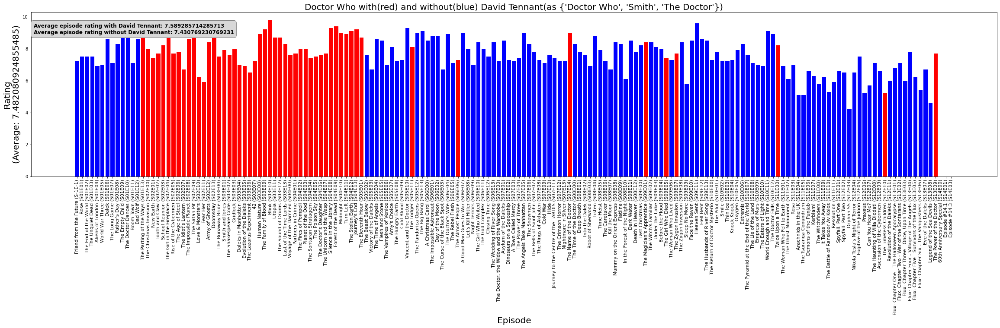

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

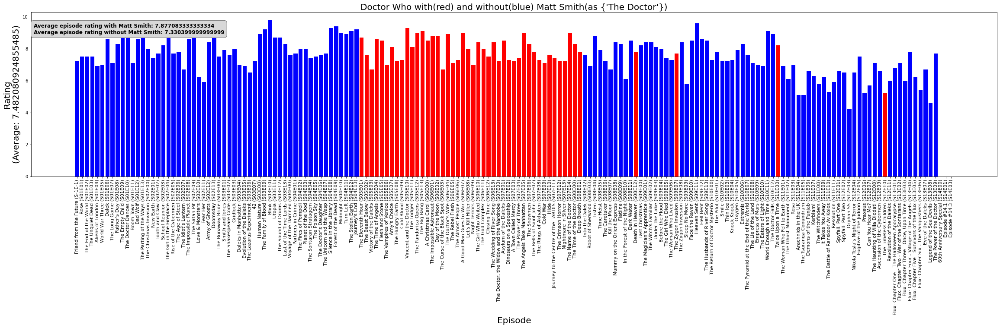

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

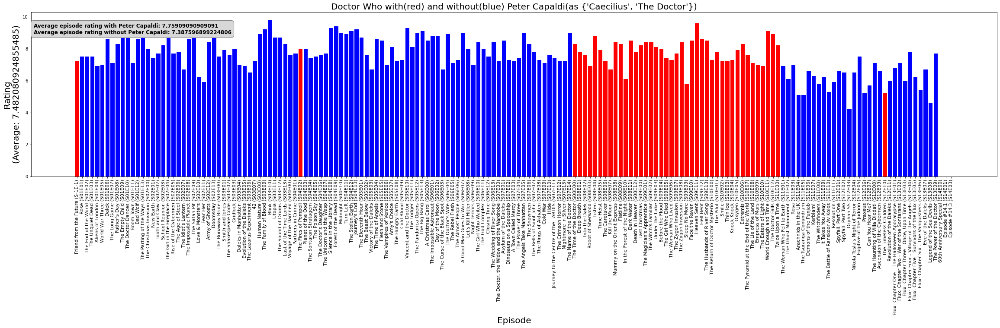

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

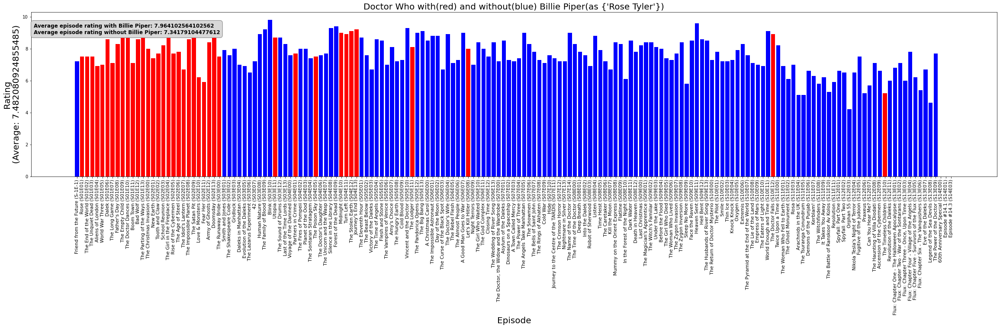

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

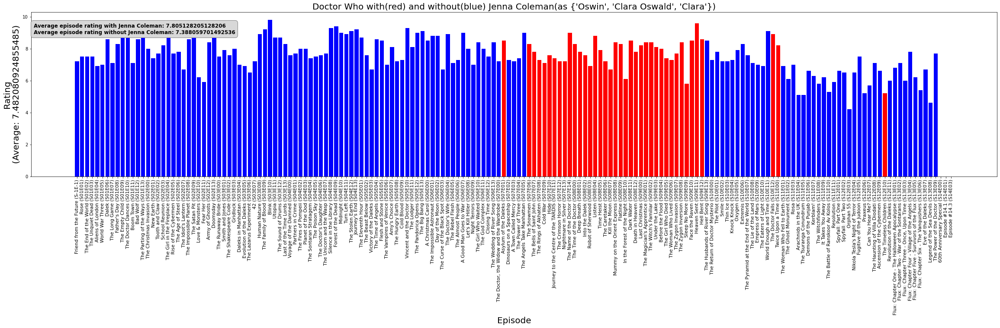

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

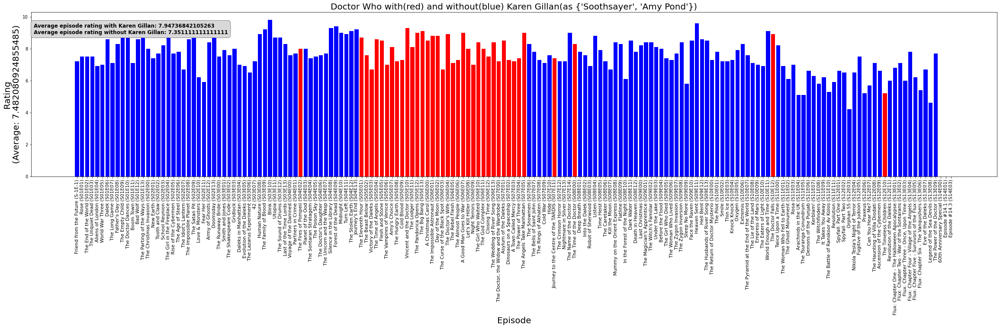

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

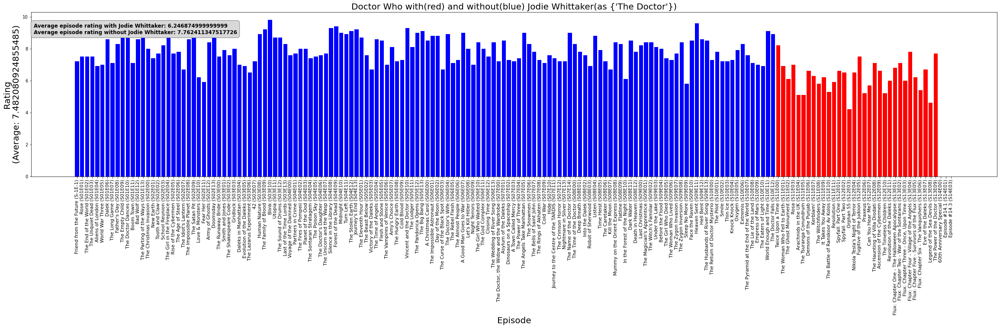

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

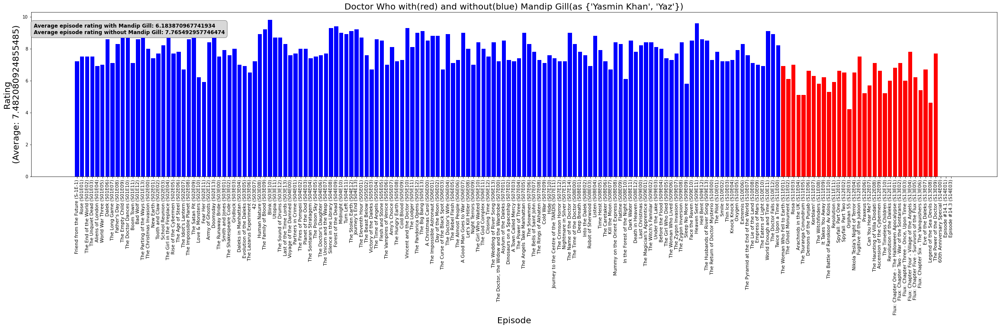

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

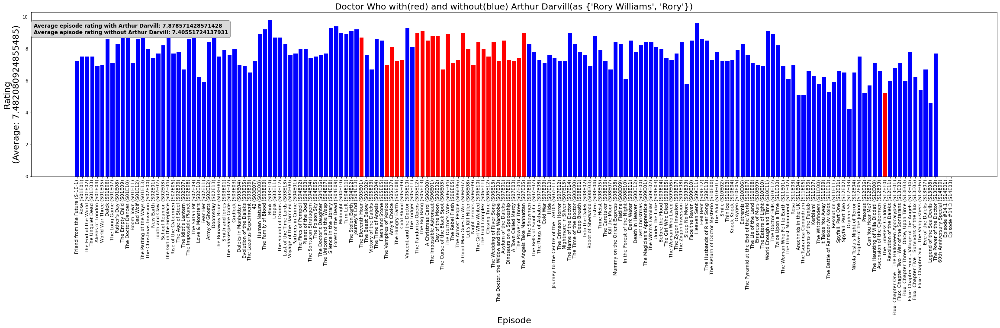

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

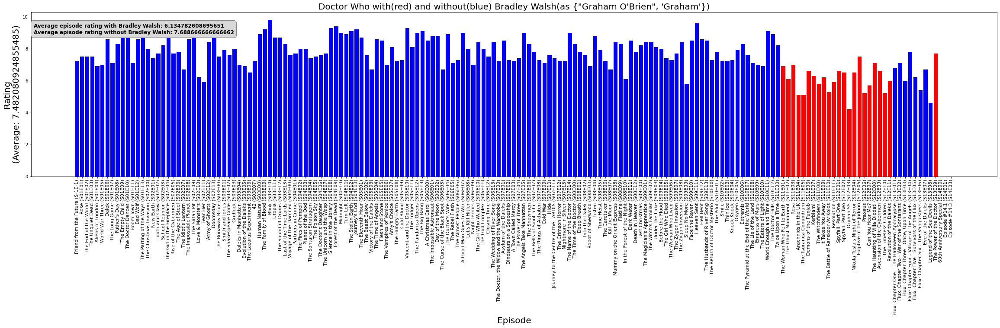

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

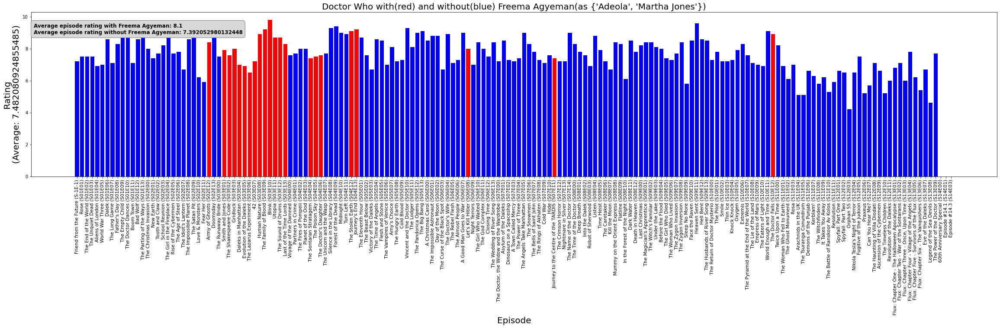

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

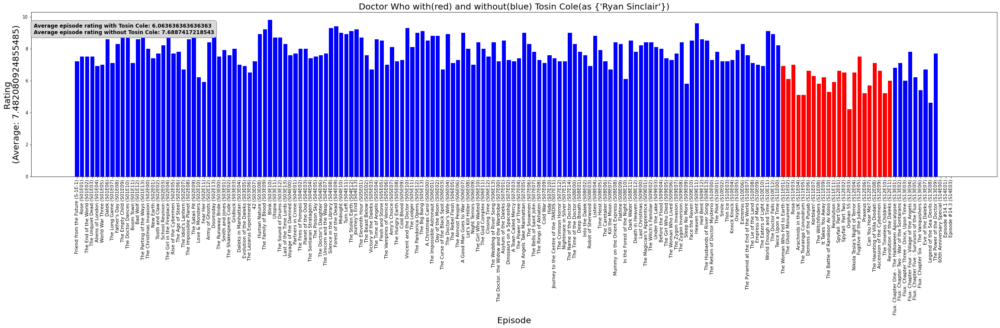

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

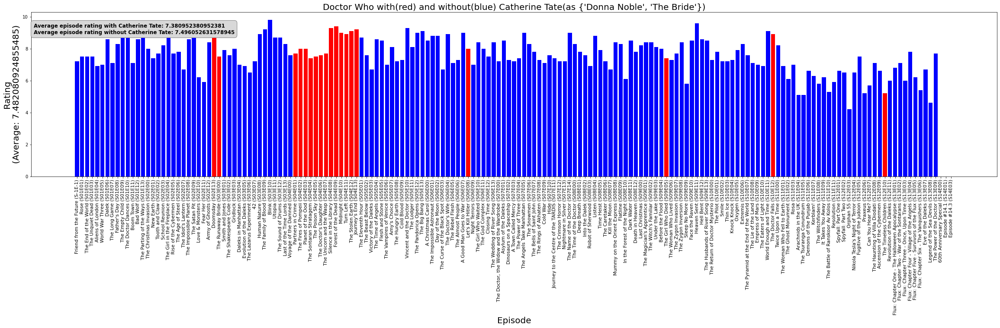

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

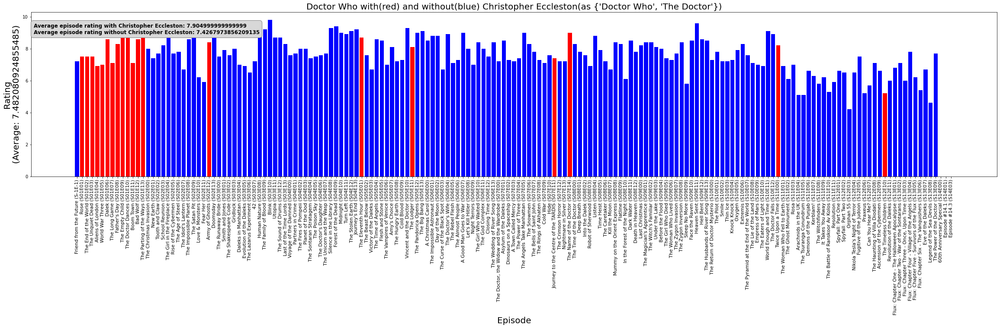

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

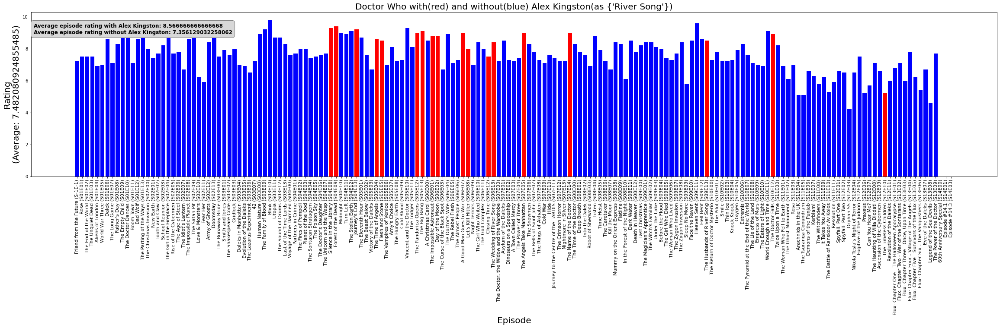

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

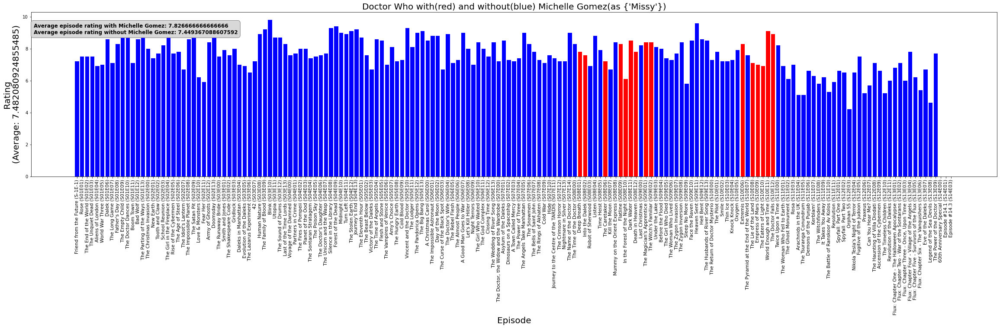

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

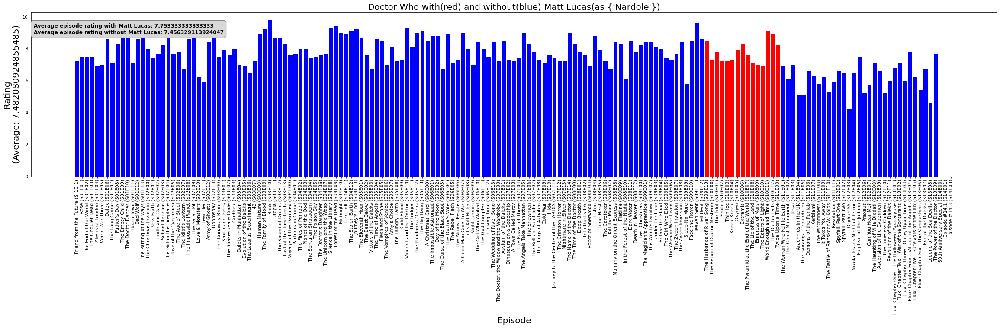

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

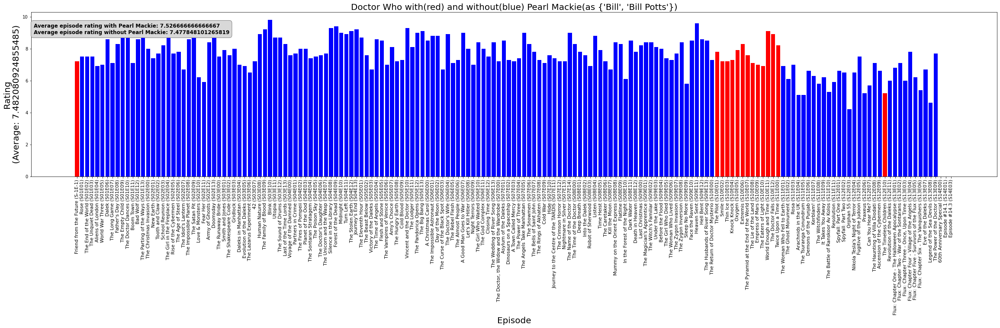

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

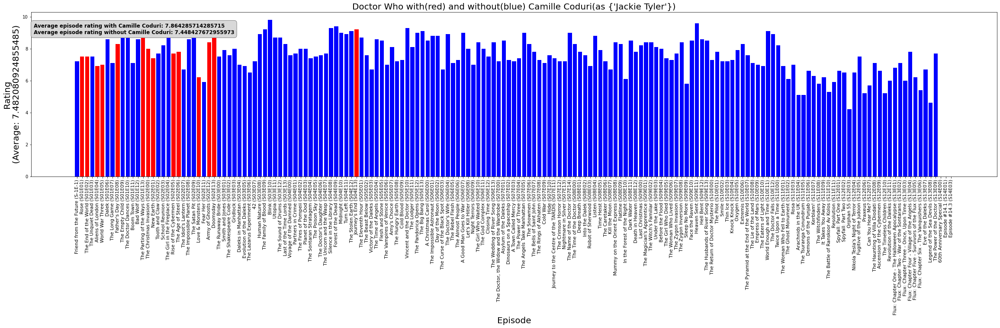

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

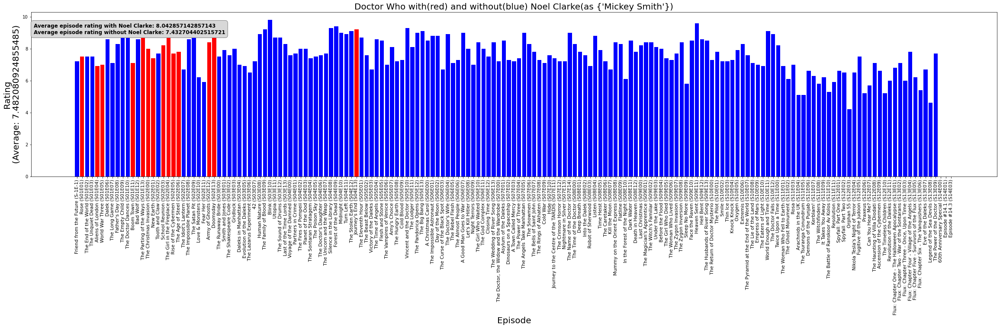

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

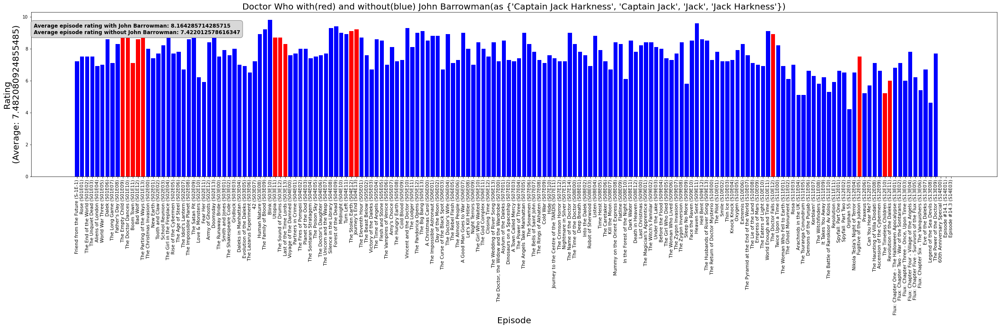

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

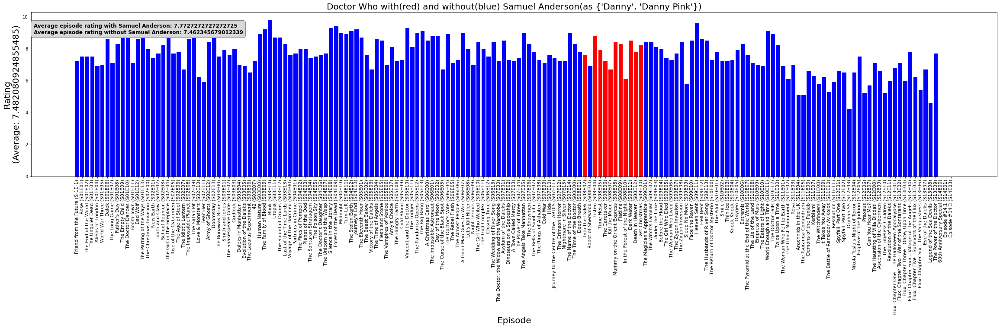

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

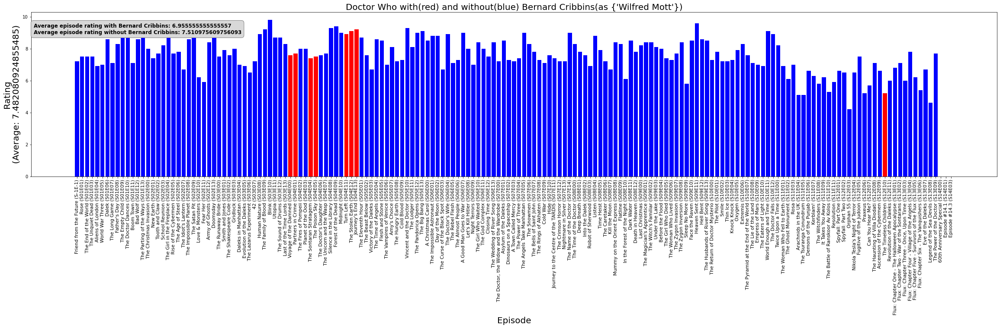

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

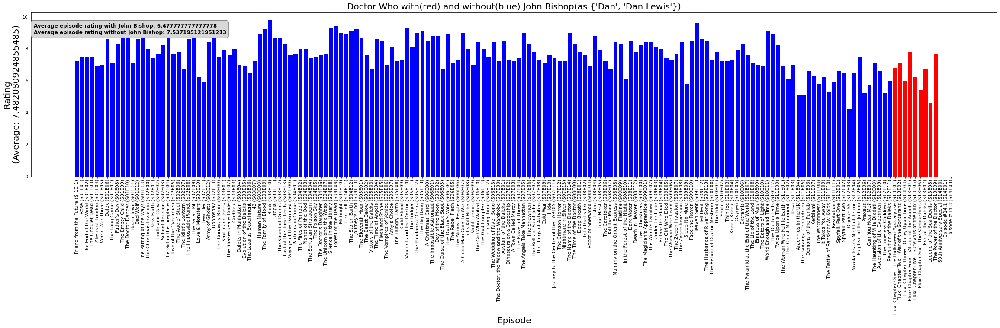

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

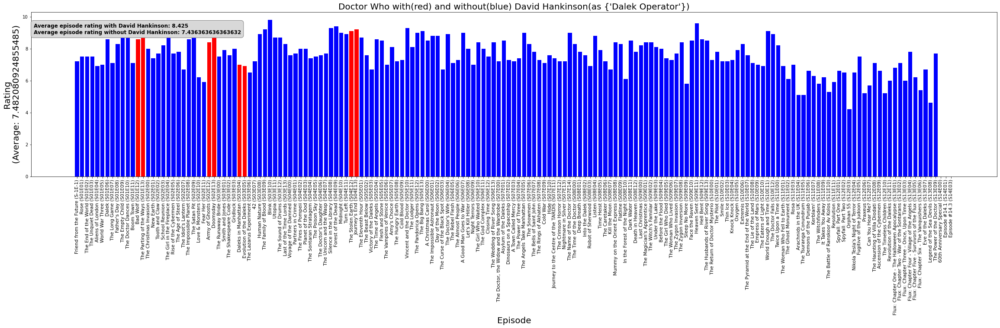

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

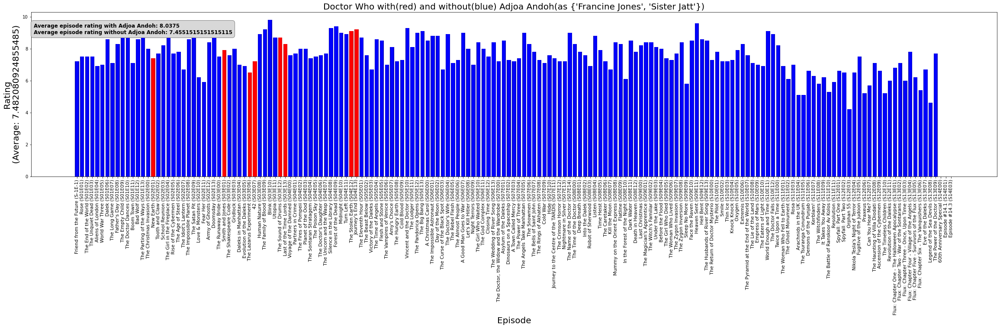

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

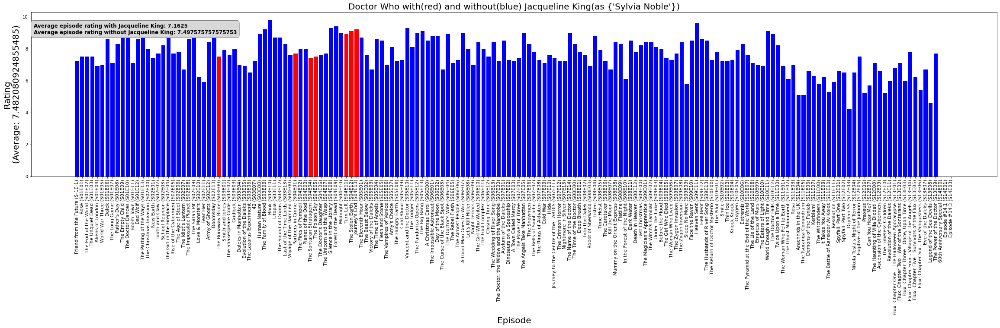

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

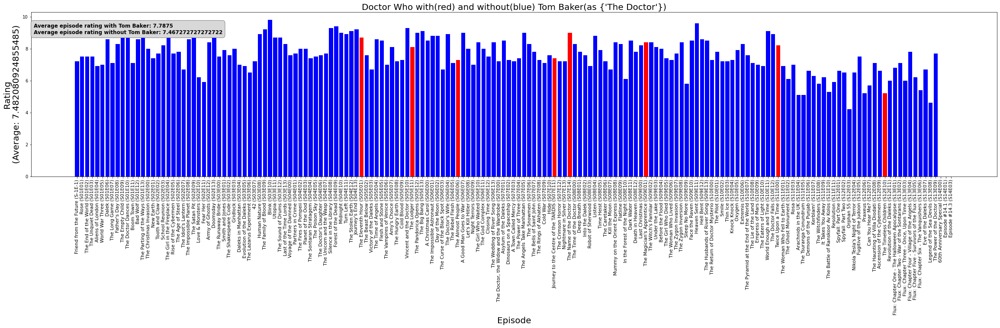

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

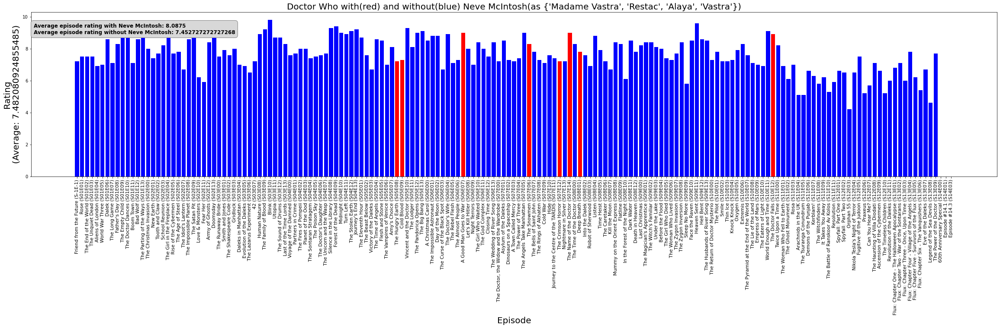

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

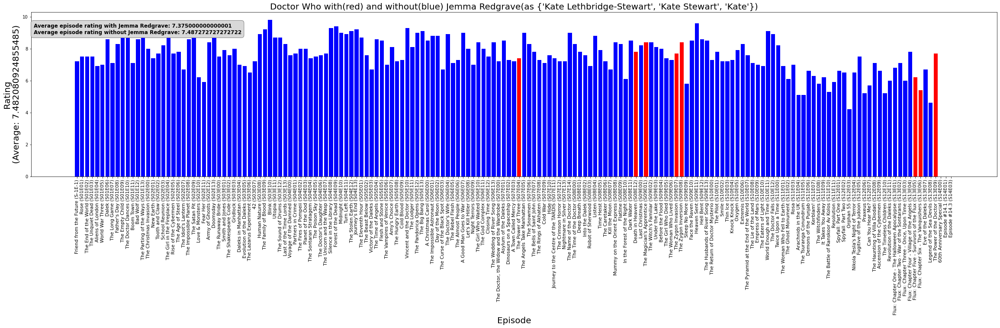

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

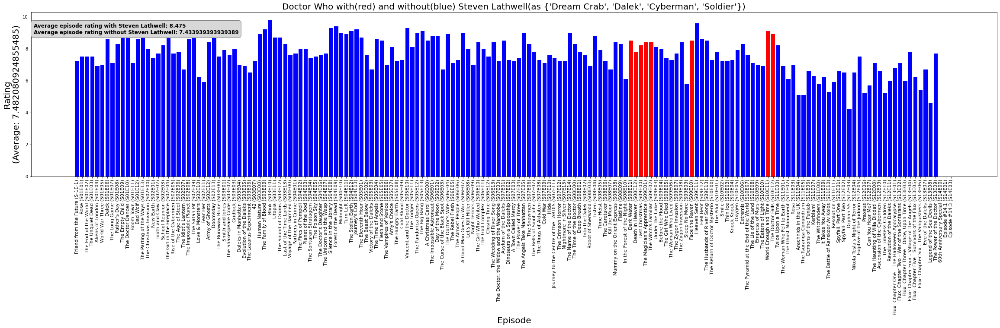

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

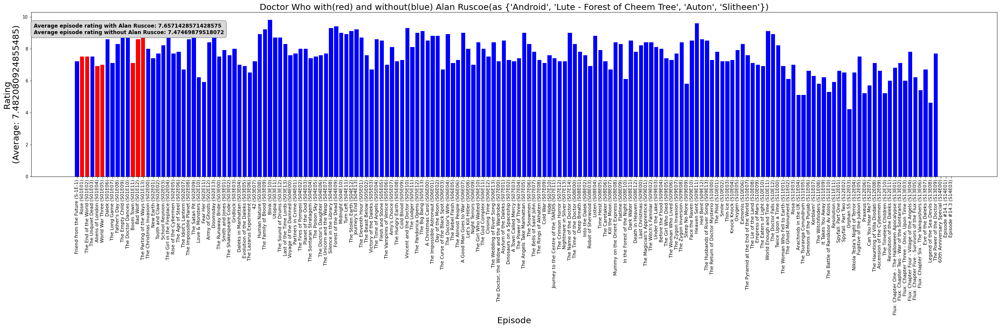

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

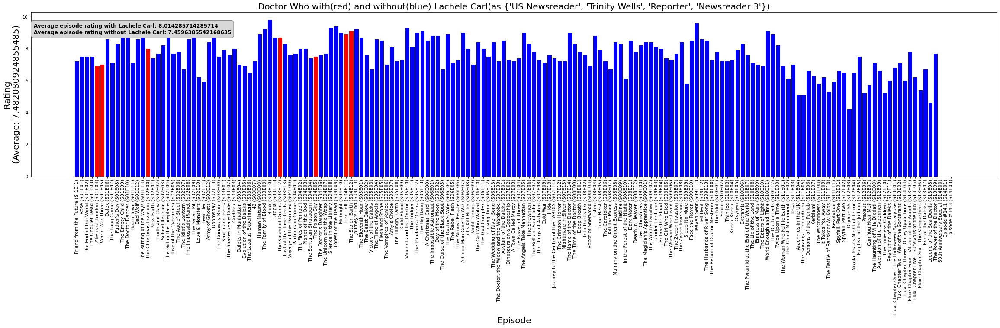

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

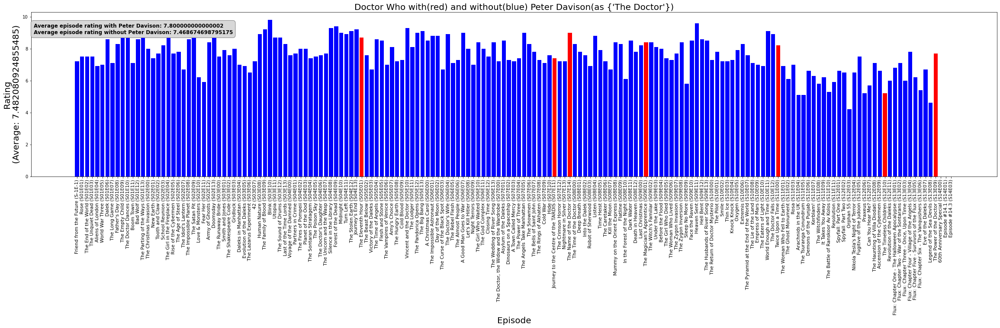

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

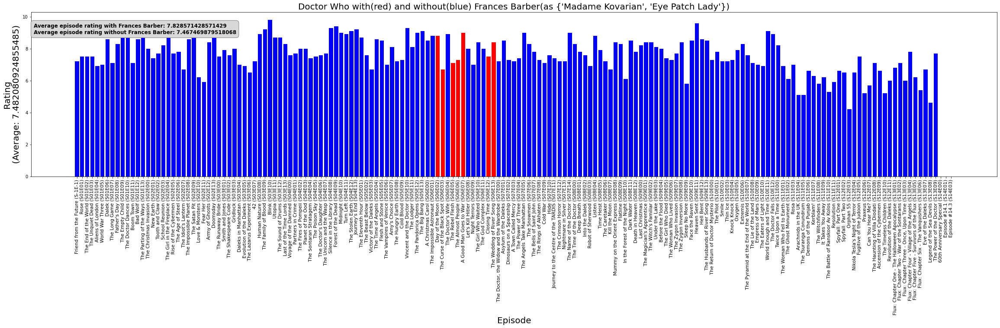

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

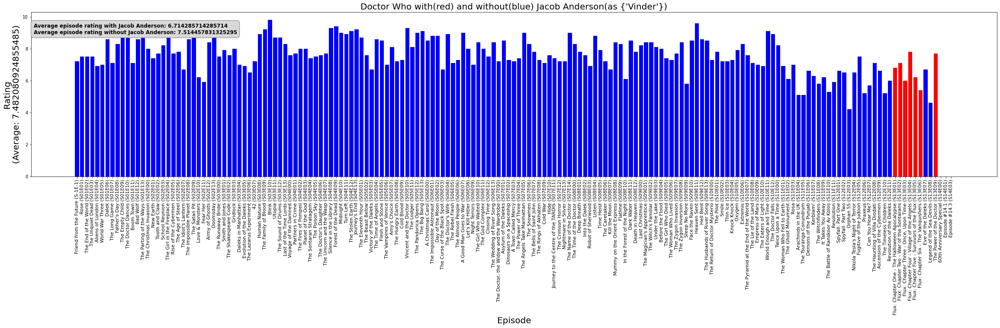

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

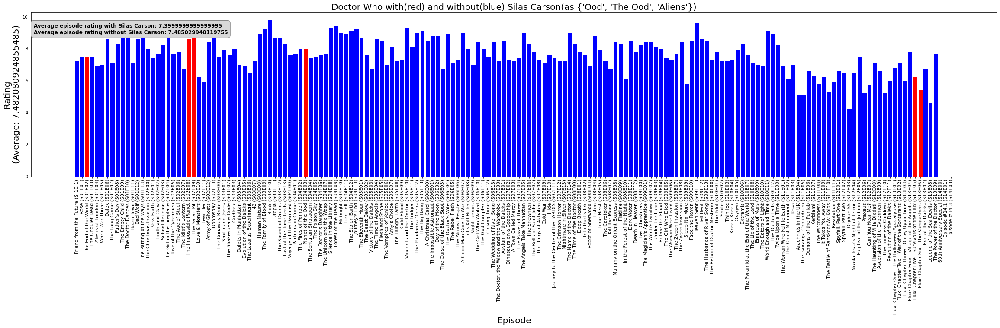

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

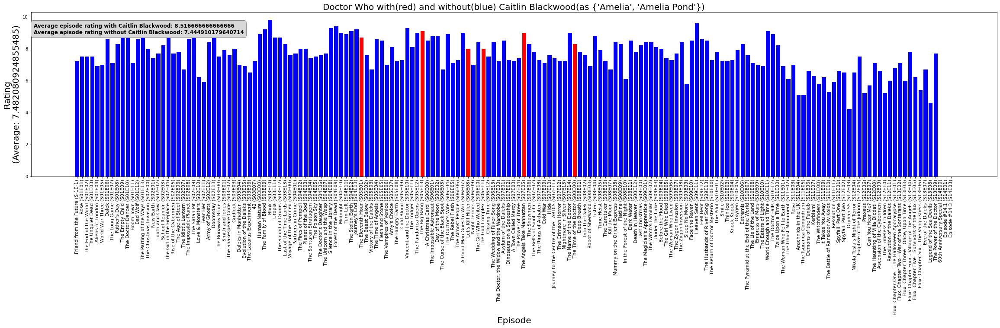

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

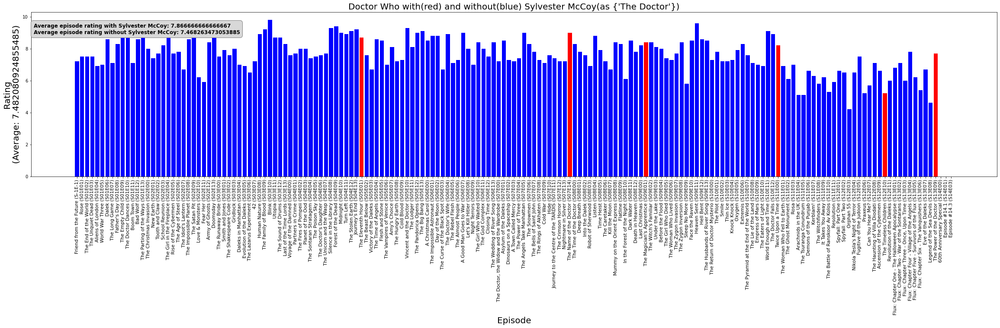

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

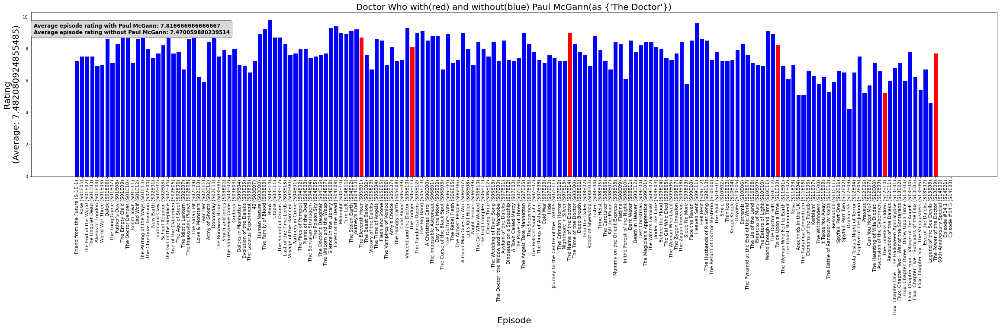

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

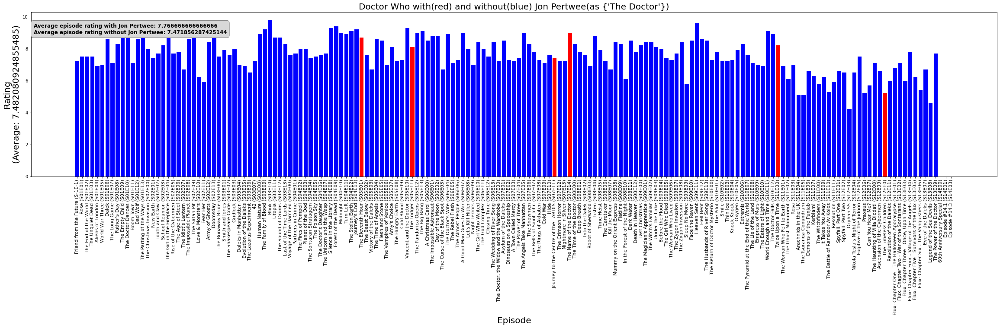

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

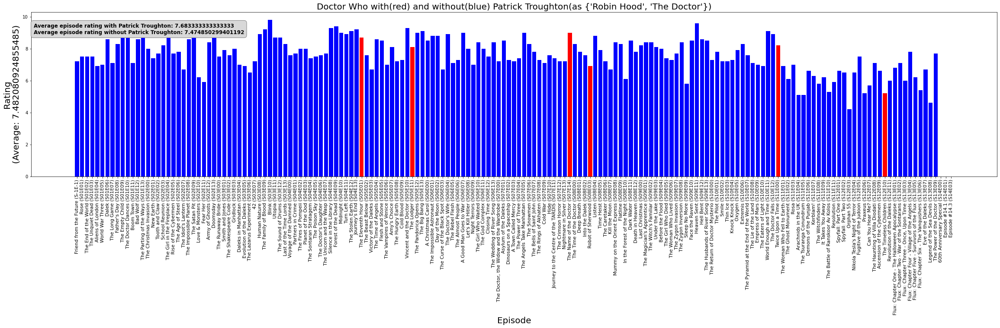

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

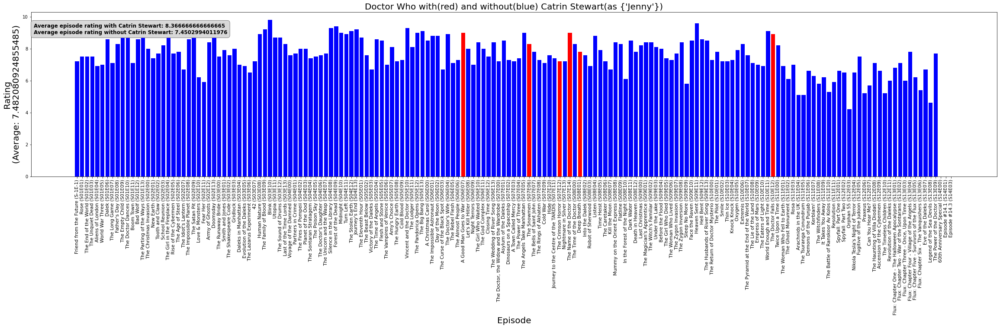

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

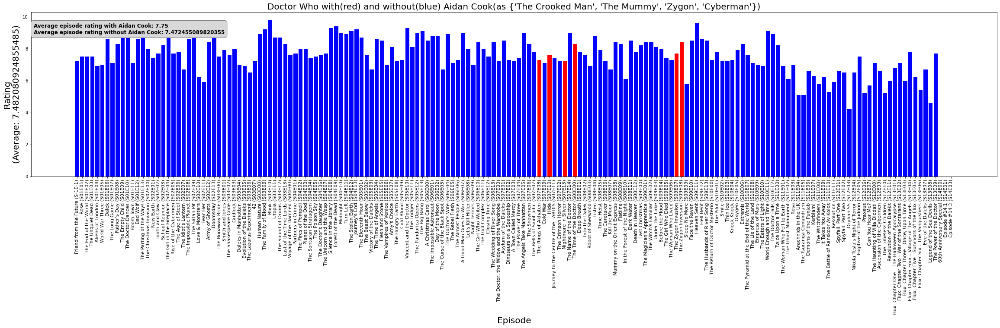

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

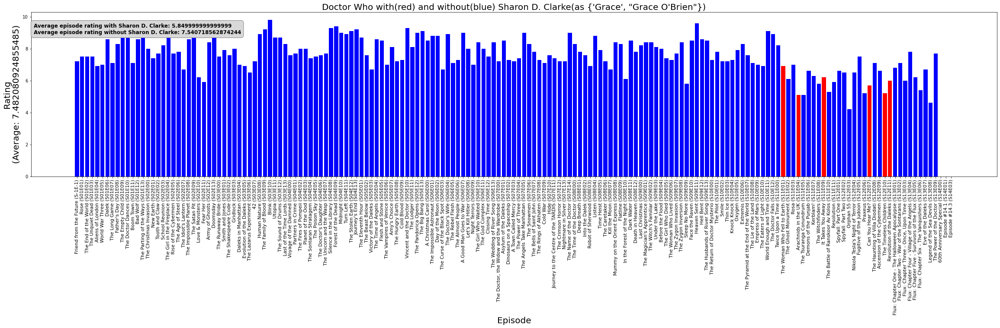

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

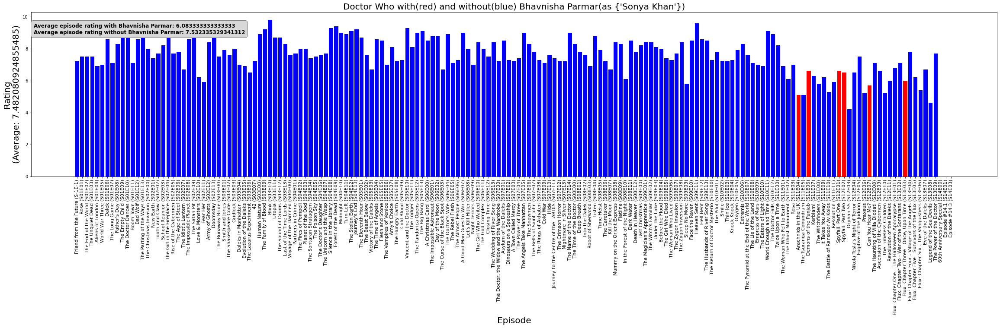

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

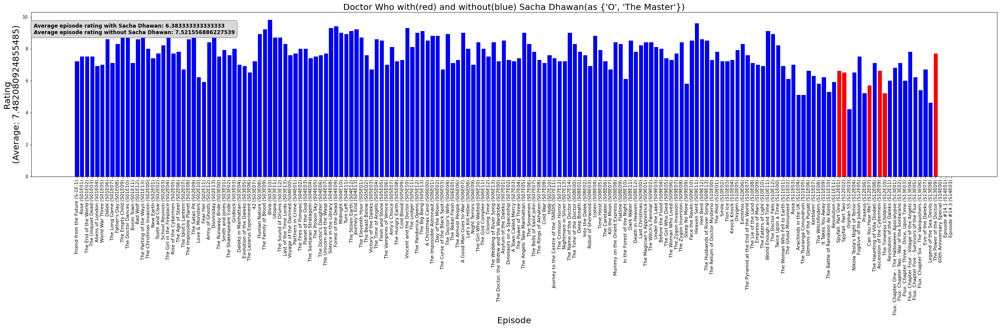

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

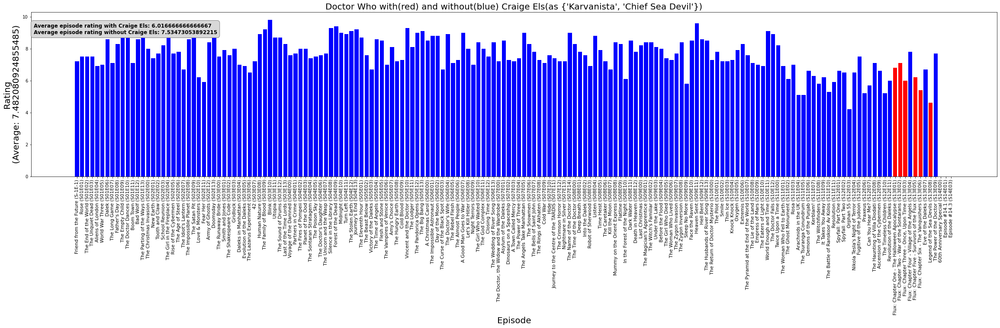

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

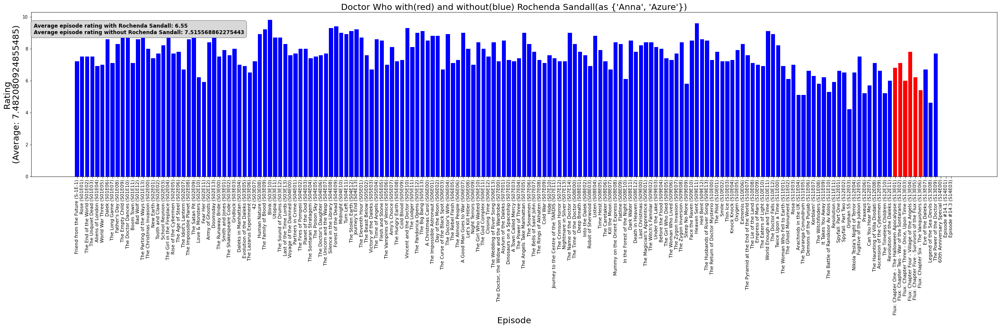

In [21]:

people_of_interest = sorted(get_people_of_interest(series, ACTORS_WITH_MORE_APPEARANCES_THAN, ACTORS_WITH_LESS_ROLES_THAN), key=lambda x:-x['appearances'])

people_of_interest.extend(PEOPLE_OF_INTEREST)

for person in people_of_interest:
  plot_ratings_with_one_actor(series, person)

In [22]:
for person1, person2 in PAIRS_OF_INTEREST:
  plot_ratings_with_two_people(series, person1, person2)
